<a href="https://colab.research.google.com/github/aadam873/Mytest/blob/master/2023_BootCamp_Day4_Optical_Flow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Day 4: Python Boot Camp
##Introduction to Motion Tracking using Optical Flow

## **Please make your own copy of this notebook before making changes or beginning the exercises!**

## Agenda
1. [**2D Optical Flow overview**](#optflow1)
2. [**2D Optical Flow on synthetic data**](#optflow2)
3. [**Limitations**](#suistanability)
4. [**Exercises (playing with the parameters and use your own data)**](#suitability)

#1. 2D Optical Flow overview

**Q: What is Optical Flow?** <br>
A: Optical flow is the pattern of **apparent motion of image objects** between **two consecutive frames** caused by the movement of object or camera. It can also be defined as the distribution of apparent velocities of movement of brightness pattern in an image.

**Example-1: Traffic cam footage called '*Hamburg taxi sequence*'**  <br>[download link](http://i21www.ira.uka.de/image_sequences/)

In [ ]:
mv_link = r"https://sandipanweb.files.wordpress.com/2018/02/taxi_opt.gif?w=555&zoom=2"
display(Image(url=mv_link,width=600,height=600))


**Example-2: A crayfish gut moving while outside the body**

In [ ]:
mv_link = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/movie_timed_v2.gif?raw=true"
display(Image(url=mv_link,width=1100,height=300))

Blue and red represents upward and downward movements respectively. The length of the vectors indicate the magnitude of motion. 

#**Optical Flow methods** <br>

*   **Lucas-Kanade algorithm** : Assumes that the **displacement** of the image contents between two nearby instants (frames) is **small** and **approximately constant** within a neighborhood of the point. 
*   **Horn-Schunck algorithm** : Assumes **smoothness in the flow** over the  **whole image**. Thus, it tries to minimize distortions in flow and prefers solutions which show more smoothness.

*   **Buxton and Buxton's algorithm** : Estimates optical flow is based on a model of the **motion of edges** in image sequences.

*   **Black-Jepson algorithm** : Computes a **maximum likelihood estimate** for the various motion parameters within a patch. 





Most of these algorithms are based on the '**equation of brightness constancy**'. It assumes that at each pixel location of an image, any fluctuation in intensity between successive frames is solely due to object motion. <br> <br> 
In other words, a point at location $(x,y)$ and time $t$ will have moved by $(\Delta x, \Delta y)$ in the short time interval $\Delta t$ and its brightness $I$ remains the same, i.e. <br>

$\mathbf{I(x,y,t) = I(x+\Delta x,y+\Delta y,t+\Delta t)}$ <br> <br>
Using Taylor's expansion we can obtain the following equation with 2 unknowns ($u$ and $v$) for two velocity components:

In [ ]:
mv_link = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/optical_flow1.png?raw=true"
display(Image(url=mv_link,width=800,height=350))

We are trying to solve for $u$ and $v$ here for each pixel location. Therefore we have an **underdetermined** system at hand! (fewer equations, more unknowns) <br> <br> Solution: For **Lucas-Kanade method**, we will assume that **flow is locally smooth**. Hence, the neighborhood pixels will have the same displacement.<br> <br> For example, assuming uniform flow in a $5\times5$ image patch will give us $25$ equations and $2$ unknowns for the two velocity components. The last step is to solve this **overdetermined system** (more equations, fewer unknowns).  

#2. 2D Optical Flow on synthetic data

**Importing all the modules**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import animation
import os; import glob; import cv2
import numpy as np
import scipy as sp
import matplotlib
from scipy import ndimage
from scipy import misc
import scipy.io as sio
import skimage.io as io
from matplotlib import rc
rc('animation', html='jshtml')
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)     # ignore warnings for specific matplotlib commands which will be outdated soon
from moviepy.video.io.bindings import mplfig_to_npimage
matplotlib.rcParams['animation.embed_limit'] = 2**128             # to set a higher threshold for maximum .gif size that we can embed here
from IPython.display import display, Image


**Creating movies with synthetic data:** <br>
***Example-1: Single particle linear motion***

In [ ]:
sx_in = 17; sy_in = -17;    # Initial location of the particle
sig = .25; 
n_fr = 50       # Number of frames in the movie
data = np.zeros([60,60,n_fr])   # Memory allocation for the synthetic data

for i in range(n_fr):
    sx = sx_in - i;           # shift the particle in x-direction by 1
    sy = sy_in + i;           # shift the particle in y-direction by 1

    [x,y] = np.meshgrid(np.arange(-30+sx,30+sx,1), np.arange(-30+sy,30+sy,1)) # Creates a 2D grid
    r = (x**2 + y**2)**(.5)/sig      # Defines a circle
    
    data[:,:,i] = r > 10           # Defines a boundary mask for the particle

**Visualizing the data**

In [ ]:
fig, ax = plt.subplots()            # create plotting object (higher dpi value creates a larger image)
im = ax.imshow(np.squeeze(data[:, :, 0]))  

cbar = fig.colorbar(im, ax=ax)             # creates a colorbar

def update(i):                             # update function that animates the movie taking successive frames
    im.set_data(data[:, :, i])

ani = animation.FuncAnimation(fig, update, frames=data.shape[2], interval=40)
plt.close(fig)
ani

**Optical Flow function (Lucas-Kanade method):** <br> <br>
Reference: Lucas BD, Kanade T. An iterative image registration technique with an application to stereo
vision | Proceedings of the 7th international joint conference on Artificial intelligence - Volume 2.
Proceedings of the 7th International Joint Conference on Artificial Intelligence. 1981:pp 674-9.

In [ ]:
# INPUT: 
# img1, img2: Successive time frames (img2 is the latter frame)
# sig: Size of the Gaussian filter for smoothing the image gradients
# thresh: Reliability score threshold (higher value would indicate less flow vectors would satisfy the criteria)


# OUTPUT:
# vx: x-component of velocity
# vy: y-component of velocity 
# reliabMat: Reliability score for velocity at each pixel location


def LKxOptFlow(img1,img2,sig,thresh):

    # Obtaining spatio-temporal image gradients
    ddy = np.gradient(img1,axis=0,edge_order=2)      
    ddx = np.gradient(img1,axis=1,edge_order=2)
    dt = img2 - img1

    wdx2 = sp.ndimage.gaussian_filter(ddx**2, sig, mode='nearest')
    wdy2 = sp.ndimage.gaussian_filter(ddy**2, sig, mode='nearest')
    wdxy = sp.ndimage.gaussian_filter(ddx*ddy, sig, mode='nearest')
    wdtx = sp.ndimage.gaussian_filter(ddx*dt, sig, mode='nearest')
    wdty = sp.ndimage.gaussian_filter(ddy*dt, sig, mode='nearest')

    trace = wdx2 + wdy2; determinant=(wdx2*wdy2)-(wdxy**2); eps = np.finfo(float).eps
    
    e1=(trace + np.sqrt(eps + trace**2 - 4*determinant))/2;
    e2=(trace - np.sqrt(eps + trace**2 - 4*determinant))/2;

    # Ensuring roots are real (due to properties of S.P.D matrix)
    if (np.amin(eps + trace**2 - 4*determinant) < 0):
        print ('Error!',np.amin(eps + trace**2 - 4*determinant))

    reliabMat = np.minimum(e1,e2);    # Realiabilty scores for each flow vector
    
    # Obtaining the x and y component of velocities
    vx = ((determinant + eps)**(-1))*((wdxy*wdty)-(wdy2*wdtx));
    vy = ((determinant + eps)**(-1))*((wdxy*wdtx)-(wdx2*wdty));
    
    # Only selecting flow vectors above the reliability threshold
    vx = vx*(reliabMat > thresh);
    vy = vy*(reliabMat > thresh);
    return vx, vy, reliabMat

**Decluttering the vector field (for visualization purpose)**  <br>
This gets rid of a lot of excess flow vectors. Otherwise the figure becomes too congested!

In [ ]:
# INPUT: 
# vx: x-component of velocity field
# vy: y-component of velocity field
# s: Number of successive vectors to skip (for visualization)


# OUTPUT:
# vx: decluttered x velocity field
# vy: decluttered y velocity field

def declutter_quiver(vx,vy,s):
    nx,ny = vx.shape
    vxn = np.copy(vx); vyn = np.copy(vy)
    vxn[np.mod(np.arange(0,nx,1),s)!=0,:] = 0 
    vyn[np.mod(np.arange(0,nx,1),s)!=0,:] = 0 
    vxn[:,np.mod(np.arange(0,ny,1),s)!=0] = 0 
    vyn[:,np.mod(np.arange(0,ny,1),s)!=0] = 0 
    return vxn,vyn

**Performing Optical Flow on all time-frames**

In [ ]:
leng = len(data)

# Memory allocation for storing optical flow results
vx_data = np.zeros([leng,leng,n_fr-1]) 
vy_data = np.zeros([leng,leng,n_fr-1]) 
vel_data = np.zeros([leng,leng,n_fr-1]) 
rel_data = np.zeros([leng,leng,n_fr-1]) 

sigma = 1.5        # smoothing parameter for the inbuilt Gaussian filter
rel_fac = 0.02     # Reliability score threshold 

for k in range(n_fr-1):

    I1 = data[:,:,k]         # loading the initial frame of a pair
    I2 = data[:,:,k+1]       # loading the next frame of a pair

    vx,vy,rel = LKxOptFlow(I1,I2,sigma,rel_fac)     # obtaining the vector fields
    
    vx_data[:,:,k] = vx; vy_data[:,:,k] = vy; rel_data[:,:,k] = rel; 
    vel_data[:,:,k] = np.sqrt(vx**2 + vy**2)        # define magnitude of motion

**Visualizing the velocity magnitudes from Optical Flow results** <br>
Units are in #pixels/frame.

In [ ]:
fig, ax = plt.subplots()

im = ax.imshow(np.squeeze(vel_data[:, :, 0]))

cbar = fig.colorbar(im, ax=ax)   # creates a colorbar

def update(i):                   # update function that animates the movie taking successive frames
    im.set_data(vel_data[:, :, i])

ani = animation.FuncAnimation(fig, update, frames = vel_data.shape[2], interval=40)
plt.close(fig)
ani                             # starts the animation

**Visualizing the reliability score from Optical Flow results (good sanity check)** <br> Ideally, it should overlap with the location of the movement. If not, we have a problem here!

In [ ]:
fig, ax = plt.subplots()
im = ax.imshow(np.squeeze(rel_data[:, :, 0]))

cbar = fig.colorbar(im, ax=ax)              # creates a colorbar

def update(i):                              # update function that animates the movie taking successive frames
    im.set_data(rel_data[:, :, i])

ani = animation.FuncAnimation(fig, update, frames = rel_data.shape[2], interval=40)
plt.close(fig)
ani

**Visualizing the vector field over all time frames** <br>
We want to overlay the vector field on top of the raw images.

In [ ]:
[X,Y] = np.meshgrid(np.arange(0,60,1), np.arange(0,60,1))             # Creates a 2D grid
U = np.squeeze(vx_data[:,:,0]); V = np.squeeze(vy_data[:,:,0])        # reshape the vector fields into 2D (in case they had the wrong shape)

fig, ax = plt.subplots()
c = ax.imshow(np.squeeze(data[:, :, 0]), origin='upper')              # shows the raw image
im = ax.quiver(X,Y,U,V,angles='xy',color='red',minshaft=1,minlength = 0.5, \
           pivot='middle',scale=30,width=0.005)                       # plots the vector field

cbar = fig.colorbar(c, ax=ax)

def update_quiver(num, im, X, Y):                                     # update function for the animation
    U = np.squeeze(vx_data[:,:,num]); 
    V = np.squeeze(vy_data[:,:,num])
    c.set_data(data[:, :, num])
    im.set_UVC(U,V)
    return im,

anim = animation.FuncAnimation(fig, update_quiver, fargs=(im, X, Y),
                               interval=30.0, frames=n_fr-1, blit=False)
fig.tight_layout()
plt.close(fig)
anim                                                                  # starts the animation

**Decluttering the vector fields** <br>
To reduce the number of vectors overlaid on top of the particle.

In [ ]:
# Memory allocation for storing modified vector fields

vx_dc_data = np.zeros([60,60,n_fr-1]); 
vy_dc_data = np.zeros([60,60,n_fr-1]);

n_jump = 2;     # Number of vectors to skip on each row and column

for i in range(n_fr-1):
    vx_frame = vx_data[:,:,i]; vy_frame = vy_data[:,:,i];
    [vx_dc,vy_dc] = declutter_quiver(vx_frame,vy_frame,n_jump)   
    vx_dc_data[:,:,i] = vx_dc; vy_dc_data[:,:,i] = vy_dc;

**Visualizing decluttered vector fields**
<br> Note: We can also go for 3 or 4 vectors for each instance. 

In [ ]:
[X,Y] = np.meshgrid(np.arange(0,60,1), np.arange(0,60,1))
U = np.squeeze(vx_dc_data[:,:,0]); V = np.squeeze(vy_dc_data[:,:,0])

fig, ax = plt.subplots()
c = ax.imshow(np.squeeze(data[:, :, 0]), origin='upper')    # shows the raw image
im = ax.quiver(X,Y,U,V,angles='xy',color='red',minshaft=1,minlength=0.5, \
           pivot='middle',scale=13,width=0.005)             # plots the vector field


## Most important QUIVER parameters

# minlength: arrows below this length would be shows as a tiny dot
# scale: scale for the arrows (smaller number would indicate much larger arrows)
# width: width of the arrows (higher number would mean thicker arrows)

cbar = fig.colorbar(c, ax=ax)

def update_quiver(num, im, X, Y):            # Update function for the animation
    U = np.squeeze(vx_dc_data[:,:,num]); 
    V = np.squeeze(vy_dc_data[:,:,num]); 

    c.set_data(data[:, :, num])
    im.set_UVC(U,V)
    return im,

anim = animation.FuncAnimation(fig, update_quiver, fargs=(im, X, Y),
                               interval=30, frames=n_fr-1, blit=False)
fig.tight_layout()
plt.close (fig)
anim

**Example-2:** 
***Three particles rotating in a circular orbit*** <br>
**Creating the particle trajectories**

In [ ]:
w = 0.05;               # Angular frequency
n_fr = 150;             # Number of frames 
x_in = 10; y_in = 10    # Controls the starting locations of the particles

# Memory allocation for x and y locations of the particles
x1_arr = np.zeros(n_fr); y1_arr = np.zeros(n_fr)
x2_arr = np.zeros(n_fr); y2_arr = np.zeros(n_fr)
x3_arr = np.zeros(n_fr); y3_arr = np.zeros(n_fr)

for i in range(n_fr):                # Obtaining the trajectories
    x1_arr[i] = x_in*np.cos(w*i); y1_arr[i] = y_in*np.sin(w*i)
    x2_arr[i] = x_in*np.cos(w*(n_fr+i)); y2_arr[i] = y_in*np.sin(w*(n_fr+i))
    x3_arr[i] = x_in*np.cos(w*(n_fr/2+i)); y3_arr[i] = y_in*np.sin(w*(n_fr/2+i))

**Visualizing the trajectories of the particles**

In [ ]:
fig, ax = plt.subplots()

im1, = ax.plot(x1_arr[0],y1_arr[0],color='red',marker='o',markersize=10)
im2, = ax.plot(x2_arr[0],y2_arr[0],color='blue',marker='o',markersize=10)
im3, = ax.plot(x3_arr[0],y3_arr[0],color='green',marker='o',markersize=10)

ax.set_xlim(-20,20); ax.set_ylim(-20,20)         # set the x and y-bounds of the plot

in_fig = mplfig_to_npimage(fig); in_fig_comp = in_fig[:,:,0]
y_len = np.shape(in_fig_comp)[0]; x_len = np.shape(in_fig_comp)[1]; 

data = np.zeros([y_len,x_len,n_fr])    # Memory allocation for saving all the figures

def update_plot(num, im1, im2, im3):   # update function for animating the figure
    im1.set_xdata(x1_arr[num]);  im1.set_ydata(y1_arr[num]); 
    im2.set_xdata(x2_arr[num]);  im2.set_ydata(y2_arr[num]); 
    im3.set_xdata(x3_arr[num]);  im3.set_ydata(y3_arr[num]); 

anim = animation.FuncAnimation(fig, update_plot, fargs=(im1, im2, im3), frames = n_fr, interval=25)
fig.tight_layout()
plt.close(fig)
anim  

**Saving the trajectories as individual images (and then matrices)** 

In [ ]:
for i in range(n_fr):

    fig = plt.figure(dpi=100)
    
    # Plotting the 3 particle trajectories

    plt.plot(x1_arr[i],y1_arr[i],color='red',marker='o',markersize=10)
    plt.plot(x2_arr[i],y2_arr[i],color='blue',marker='o',markersize=10)
    plt.plot(x3_arr[i],y3_arr[i],color='green',marker='o',markersize=10)

    plt.xlim(-20,20); plt.ylim(-20,20)                      # set the x and y-bounds of the plot

    np_fig = mplfig_to_npimage(fig);                        # save the current figure as a numpy matrix
    gray = cv2.cvtColor(np_fig, cv2.COLOR_BGR2GRAY)         # convert the RGB image to grayscale
    data[:,:,i] = gray                                      # storing the grayscale image as our synthetic data

    plt.close(fig)

**Performing Optical Flow by calling individual time-frames (stored as matrices)**

In [ ]:
# Memory allocation for storing optical flow results
vx_data = np.zeros([y_len,x_len,n_fr])
vy_data = np.zeros([y_len,x_len,n_fr])
vel_data = np.zeros([y_len,x_len,n_fr])
rel_data = np.zeros([y_len,x_len,n_fr])

sigma = 0.5        # smoothing parameter for the inbuilt Gaussian filter
rel_fac = 0.02     # Reliability score threshold 

for k in range(n_fr-1):

    I1 = data[:,:,k]
    I2 = data[:,:,k+1]
    vx,vy,rel = LKxOptFlow(I1,I2,sigma,rel_fac) 
    
    vx_data[:,:,k] = vx; vy_data[:,:,k] = vy; rel_data[:,:,k] = rel; 
    vel_data[:,:,k] = np.sqrt(vx**2 + vy**2)

**Visualizing the velocity magnitudes as a function of time.** <br>
Units are in #pixels/frame.

In [ ]:
fig, ax = plt.subplots()

im = ax.imshow(np.squeeze(vel_data[:, :, 0]),vmin=0,vmax=5)
cbar = fig.colorbar(im, ax=ax)

def update(i):
    im.set_data(vel_data[:, :, i])

ani = animation.FuncAnimation(fig, update, frames = vel_data.shape[2], interval=40)
plt.close(fig)
ani

**Define a function that takes in existing vector fields and returns 
a smoothed and sparser version** 

In [ ]:
# INPUT: 
# vx: x-component of velocity field
# vy: y-component of velocity field
# sigma: smoothing parameter used for the Gaussian filter
# jump: Number of successive vectors to skip (for visualization)


# OUTPUT:
# Xn: x-location mask of the non-zero vectors
# Yn: y-location mask of the non-zero vectors
# Un: x-component of the masked vectors
# Vn: y-component of the masked vectors

def quiver_processing(vx,vy,sigm,jump):    

    y_len = np.shape(vx)[0]; x_len = np.shape(vx)[1]    
    [X,Y] = np.meshgrid(np.arange(0,x_len,1), np.arange(0,y_len,1))
    
    # Gaussian smoothing of the vector field (to diminish the effect of spurious vectors)
    vx = sp.ndimage.gaussian_filter(vx, sigm, mode='nearest');
    vy = sp.ndimage.gaussian_filter(vy, sigm, mode='nearest');

    [vx,vy] = declutter_quiver(vx,vy,jump)    # declutter the exsiting vector field

    # only choose vectors with non-zero velocities

    vel = np.sqrt(vx**2+vy**2)
    mask = (vel !=0)      # mask with non-zero vectors

    # compute positions and lengths of all non-zero vectors
    Xn = np.squeeze(X*[mask])
    Yn = np.squeeze(Y*[mask])
    Un = np.squeeze(U*[mask])
    Vn = np.squeeze(V*[mask])
    
    return Xn,Yn,Un,Vn

**Visualizing the vector fields at different time-points.** <br>
Animating all the time-frames with the post-processing of vector fields takes a lot of time.


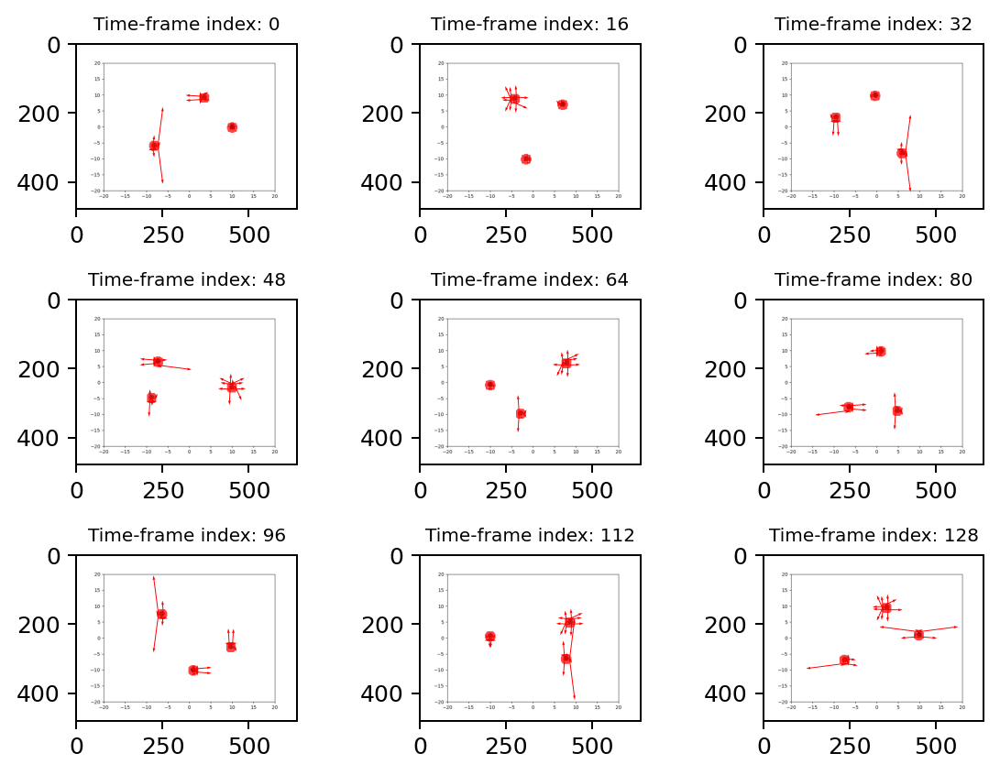

In [ ]:
gr_sz  = 3;     # grid size in only one axis (could be generalized further)
# In this case, we will generate a 3X3 image grid.

fig, ax = plt.subplots(gr_sz,gr_sz,dpi=180)   # Higher dpi value will create a larger figure.

for i in range(gr_sz):
    for j in range(gr_sz):

        jp = round((n_fr-1)/gr_sz**2)-1     # defining the number of time-frames to skip for visualization
        num = (gr_sz*i+j)*jp

        U = np.squeeze(vx_data[:,:,num]); 
        V = np.squeeze(vy_data[:,:,num])
        [Xn,Yn,Un,Vn] = quiver_processing(U,V,1.0,2)        # post-processing of vector fields

        ax[i,j].imshow(data[:,:,num],'gray')
        ax[i,j].quiver(Xn, Yn, Un, Vn, scale_units='xy', scale = 1.5, width = 0.004, angles='xy', color='red') 
        ax[i,j].set_title(f'Time-frame index: {num:d}', fontsize=8)    # sets a title to each subplot

fig.tight_layout()       # IMPORTANT. Otherwise, axes might overlap into each other!
plt.show()

#**Optical Flow limitations** <br>




1.   Optical flow algorithms (specially Lucas-Kanade method) **assume 
smoothness of flow** to different extents which **might not be valid** always. <br>   
*   'Jerky' motion leads to spurious flow vectors. <br>
*   Movies might need to be smoothed in time during data preprocessing. If need be, spatial smoothing parameter within the algorithm has to be checked further. <br>
*   Also, one needs to choose the right F.P.S value (frames per second) while imaging. 



. 



In [ ]:
## Example smoothing syntax

sigma = [0,0,1];
smo_data = sp.ndimage.gaussian_filter(data, sigma, mode='nearest')         # assuming time is along the third dimension of the data


The first two dimensions are usually y and x. Here we did not perform any spatial smoothing (hence the first two entries of the smoothing kernel is zero).

**Example of spatial smoothing on an image:**

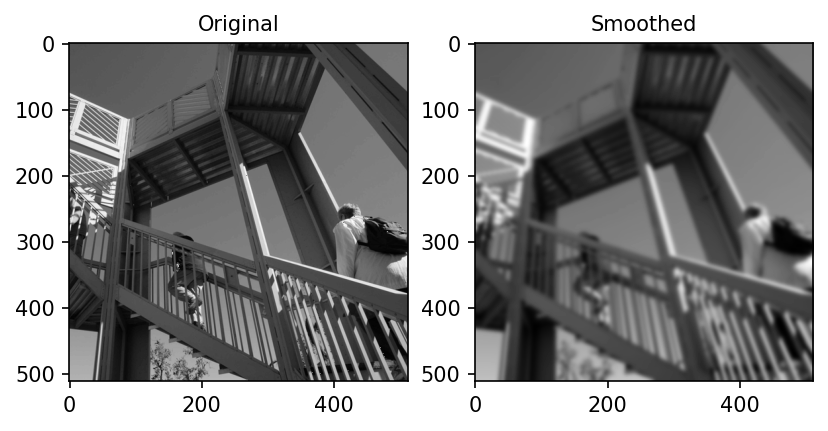

In [ ]:
from scipy import datasets

fig = plt.figure(dpi=150)

plt.gray()  # show the filtered result in grayscale
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # right side

ascent = datasets.ascent()  
result = sp.ndimage.gaussian_filter(ascent, sigma=3)

ax1.imshow(ascent); ax1.set_title('Original', fontsize=10)
ax2.imshow(result); ax2.set_title('Smoothed', fontsize=10)
plt.show()

2. **Irregular illumination** of image causes wrong estimation of movement. (here fluctuation of pixel intensity is not necessarily caused  by object motion)

In [ ]:
img_ad = r"https://www.thermofisher.com/content/dam/LifeTech/global/life-sciences/cellanalysis/Images/1014/uneven.jpg"
display(Image(url=img_ad,width=400,height=400))

3. The image should have **sharp boundaries or edges** for most reliable  flow vectors (for the structure tensor to be well-defined). <br> Low texture regions lead to unreliable motion estimation.

In [ ]:
img_ad = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/optical_flow2%20.png?raw=true"
display(Image(url=img_ad,width=400,height=400))

In [ ]:
img_ad = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/optical_flow3.png?raw=true"
display(Image(url=img_ad,width=400,height=400))

In [ ]:
img_ad = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/optical_flow4.png?raw=true"
display(Image(url=img_ad,width=400,height=400))

4. Optical flow can only extract motion perpendicular to a sharp boundary and not parallel to it ('***aperture problem***')

In [ ]:
img_ad = r"https://github.com/pathakspandan/Gut_Dynamics-/blob/main/optical_flow5.png?raw=true"
display(Image(url=img_ad,width=400,height=400))

Imagine, this image-frame moving vertically. In that case, we would not be able to detect any motion at all!!

5. Optical Flow is **not usally suitable for particle or single cell tracking** (rather '**PIV: Particle Image Velocimetry**' is used for such usage). It is most effective for studying the dynamics across multiple R.O.I's connected to each other. (for example: actin dynamics from a tagged cell image)

#4. Exercises (sensitivity analysis and use your own data)

**Final Notes:**


*   The most important parameter for optical flow is the smoothing kernel used within the algorithm (the third input to the optical flow function).
*   For visualization, decluttering the vector field is absolutely necessary!
*   Google colab struggles with loading medium to large datasets. We should ideally use Jupyter notebook for analyzing (and plotting) our own data.





#Python Bootcamp Survey
Since this was our first year running this bootcamp, we would really appreciate your feedback: please fill out this [survey](https://docs.google.com/forms/d/e/1FAIpQLSdNUdiV6C7q85cJ86C54Ug8fa16vfrGF1dzPzoYK9F7nItF_w/viewform?usp=sf_link)!